# Face Rcognition - Input Video
## Pachalam Bhasi - Udayananu Tharam Movie scene

In [15]:
import os
os.getcwd()


'/content'

In [16]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [11]:
# pip install deepface
# pip install opencv-python

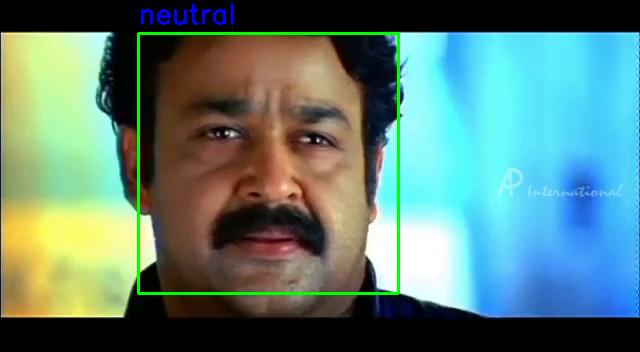

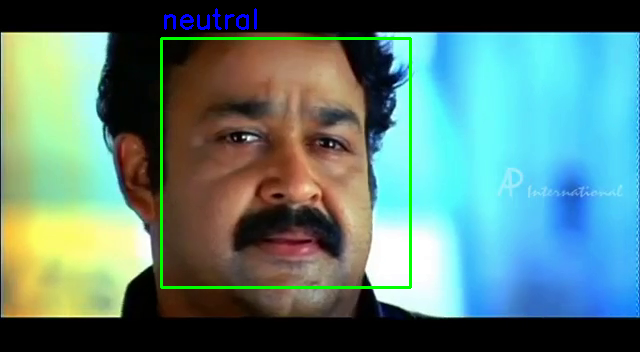

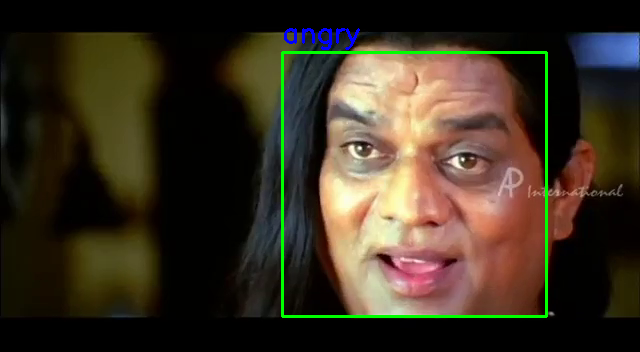

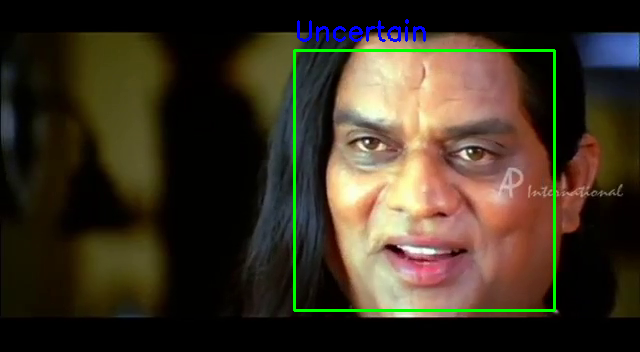

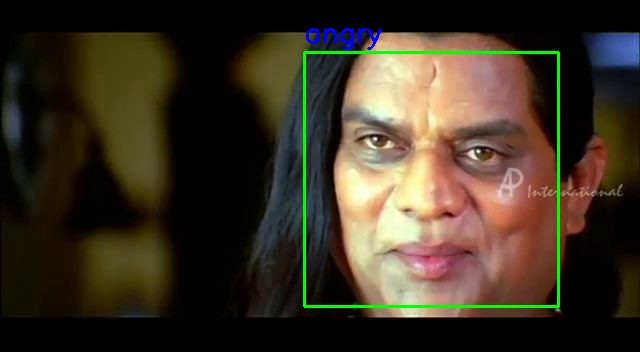

...

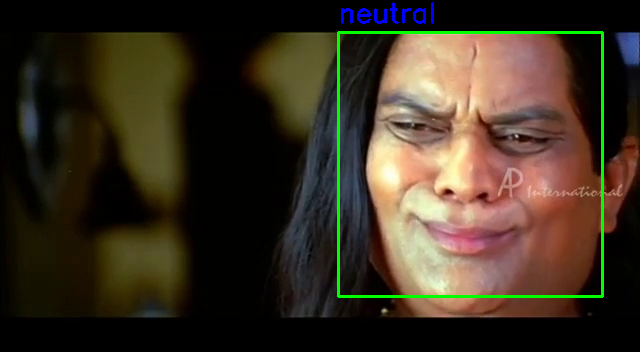

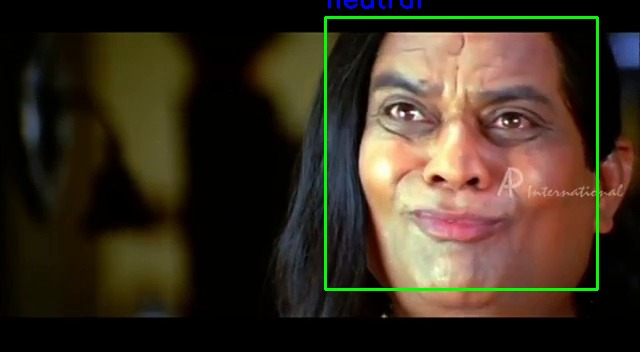

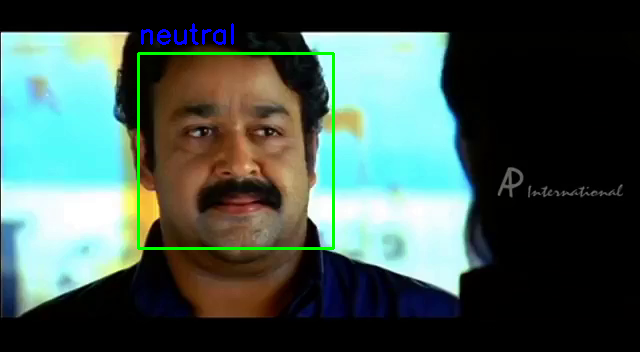

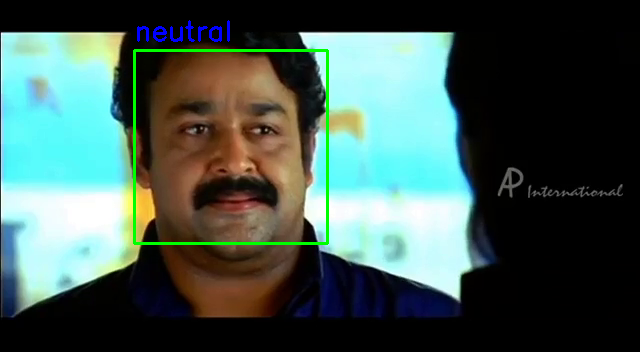

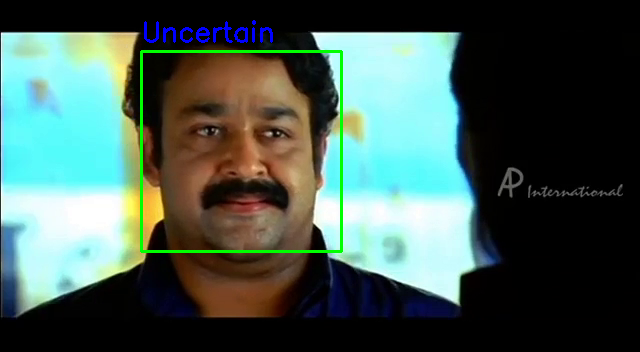

✅ Video completed.
🎥 Annotated video saved to: /content/drive/MyDrive/emotion_detection/annotated_20250709_105920.mp4


In [31]:
import cv2
import time
from deepface import DeepFace
from collections import deque, Counter
from google.colab.patches import cv2_imshow

# Input video path
input_path = "/content/drive/MyDrive/emotion_detection/jagathi_expr.mp4"
cap = cv2.VideoCapture(input_path)

# Get frame properties
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = cap.get(cv2.CAP_PROP_FPS)

# Output video path
timestamp = time.strftime('%Y%m%d_%H%M%S')
output_path = f"/content/drive/MyDrive/emotion_detection/annotated_{timestamp}.mp4"

# Define VideoWriter (use 'mp4v' codec for .mp4)
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_path, fourcc, fps, (frame_width, frame_height))

# Emotion smoothing window
emotion_window = deque(maxlen=5)

frame_count = 0

while True:
    ret, frame = cap.read()
    if not ret:
        print("✅ Video completed.")
        break

    try:
        analysis = DeepFace.analyze(img_path=frame, actions=["emotion"], enforce_detection=False)[0]
        region = analysis["region"]
        dominant_emotion = analysis["dominant_emotion"]


        # # Default behavior without filtering:
        # emotion_window.append(dominant_emotion)



        # ↓↓↓ OPTIONAL: Enable confidence filtering by uncommenting ↓↓↓
        if analysis["emotion"][dominant_emotion] > 60:
            filtered_emotion = dominant_emotion
        else:
            filtered_emotion = "Uncertain"
        emotion_window.append(filtered_emotion)

        # Smooth emotion
        smoothed_emotion = Counter(emotion_window).most_common(1)[0][0]

        # Draw bounding box and label
        x, y, w, h = region['x'], region['y'], region['w'], region['h']
        cv2.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 0), 2)
        cv2.putText(frame, smoothed_emotion, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX,
                    0.9, (255, 0, 0), 2)

    except Exception as e:
        print(f"Frame {frame_count}: Face not detected")

    out.write(frame)

    # Preview every 10 frames in Colab
    if frame_count % 10 == 0:
        cv2_imshow(frame)

    frame_count += 1

# Release resources
cap.release()
out.release()

print(f"🎥 Annotated video saved to: {output_path}")


In [27]:
!apt-get -y install ffmpeg


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
ffmpeg is already the newest version (7:4.4.2-0ubuntu0.22.04.1).
0 upgraded, 0 newly installed, 0 to remove and 35 not upgraded.


In [32]:
# Variables
INPUT_VIDEO="/content/drive/MyDrive/emotion_detection/jagathi_expr.mp4"
ANNOTATED_VIDEO="/content/drive/MyDrive/emotion_detection/annotated_20250709_105920.mp4"
FINAL_VIDEO="/content/drive/MyDrive/emotion_detection/annotated_with_audio.mp4"

# Merge original audio with annotated video
# !ffmpeg -y -i "$ANNOTATED_VIDEO" -i "$INPUT_VIDEO" -c copy -map 0:v:0 -map 1:a:0 -shortest "$FINAL_VIDEO"


!ffmpeg -y -i "$ANNOTATED_VIDEO" -i "$INPUT_VIDEO" \
-map 0:v:0 -map 1:a:0 \
-c:v libx264 -c:a aac -strict experimental \
-pix_fmt yuv420p -movflags +faststart \
-shortest "$FINAL_VIDEO"


ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab